In [ ]:
import matplotlib.pyplot as plt
from matplotlib import cm
from mpl_toolkits.mplot3d import Axes3D
import copy
import numpy as np

In [ ]:
X = np.linspace(-1, 1, 256)
Y = np.linspace(-1, 1, 256)
x, y = np.meshgrid(X, Y)
# x, y = np.meshgrid(np.linspace(-1,1,10), np.linspace(-1,1,10))
d = np.sqrt(x*x+y*y)

In [ ]:
def gauss(mu, sigma, c):
  return c*(np.exp(-((d-mu)**2 / (2.0 * sigma**2))))
mat1=gauss(1.0, 1.0, 3)
print(mat1)

[[2.75337065 2.75964821 2.76583082 ... 2.76583082 2.75964821 2.75337065]
 [2.75964821 2.7658797  2.7720155  ... 2.7720155  2.7658797  2.75964821]
 [2.76583082 2.7720155  2.77810377 ... 2.77810377 2.7720155  2.76583082]
 ...
 [2.76583082 2.7720155  2.77810377 ... 2.77810377 2.7720155  2.76583082]
 [2.75964821 2.7658797  2.7720155  ... 2.7720155  2.7658797  2.75964821]
 [2.75337065 2.75964821 2.76583082 ... 2.76583082 2.75964821 2.75337065]]


In [ ]:
def mask_gauss(mat):
  mask = np.zeros(mat.shape[:2], dtype="uint8")
  tmp_mat=copy.deepcopy(mat)
  tmp=int(int(len(mat[0]))/int(2))
  for i in range(len(mat)):
    for j in range(tmp):
      mask[i][j]=1
  for i in range(len(mat)):
    for j in range(len(mat[0])):
      if(mask[i][j]!=1):
        tmp_mat[i][j]=0
  return tmp_mat

In [ ]:
mat2=mask_gauss(mat1)
print(mat2)

[[2.75337065 2.75964821 2.76583082 ... 0.         0.         0.        ]
 [2.75964821 2.7658797  2.7720155  ... 0.         0.         0.        ]
 [2.76583082 2.7720155  2.77810377 ... 0.         0.         0.        ]
 ...
 [2.76583082 2.7720155  2.77810377 ... 0.         0.         0.        ]
 [2.75964821 2.7658797  2.7720155  ... 0.         0.         0.        ]
 [2.75337065 2.75964821 2.76583082 ... 0.         0.         0.        ]]


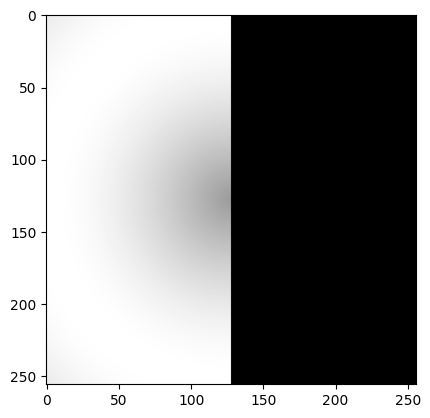

In [ ]:
# plt.imshow(mat2)
plt.gray()
plt.imshow(mat2)
plt.show()

In [ ]:
def gen_c_val(n):
  c_val=[]
  for i in range(n):
    cv=np.random.randint(1, 500)
    c_val.append(cv)
  return c_val

In [ ]:
from PIL import Image
import os

c_vals=gen_c_val(50)
matrices=[]
for i in c_vals:
  for mu in range(1,5):
    for sigma in range(1,5):
      mat=gauss(mu, sigma, i)
      matrices.append(mat)

masked_mat_gray=[]
for i in matrices:
  masked=mask_gauss(i)
  plt.gray()
  masked_mat_gray.append(masked)



<Figure size 640x480 with 0 Axes>

In [ ]:
#  for i in matrices:
#    plt.imshow(i)
#    plt.show()

In [ ]:
print(matrices)

[array([[213.84512027, 214.33267787, 214.81286   , ..., 214.81286   ,
        214.33267787, 213.84512027],
       [214.33267787, 214.81665665, 215.29320384, ..., 215.29320384,
        214.81665665, 214.33267787],
       [214.81286   , 215.29320384, 215.76605965, ..., 215.76605965,
        215.29320384, 214.81286   ],
       ...,
       [214.81286   , 215.29320384, 215.76605965, ..., 215.76605965,
        215.29320384, 214.81286   ],
       [214.33267787, 214.81665665, 215.29320384, ..., 215.29320384,
        214.81665665, 214.33267787],
       [213.84512027, 214.33267787, 214.81286   , ..., 214.81286   ,
        214.33267787, 213.84512027]]), array([[228.05614398, 228.18602252, 228.31371993, ..., 228.31371993,
        228.18602252, 228.05614398],
       [228.18602252, 228.31472874, 228.44124634, ..., 228.44124634,
        228.31472874, 228.18602252],
       [228.31371993, 228.44124634, 228.56657649, ..., 228.56657649,
        228.44124634, 228.31371993],
       ...,
       [228.3137199

In [ ]:
print(masked_mat_gray)

[array([[213.84512027, 214.33267787, 214.81286   , ...,   0.        ,
          0.        ,   0.        ],
       [214.33267787, 214.81665665, 215.29320384, ...,   0.        ,
          0.        ,   0.        ],
       [214.81286   , 215.29320384, 215.76605965, ...,   0.        ,
          0.        ,   0.        ],
       ...,
       [214.81286   , 215.29320384, 215.76605965, ...,   0.        ,
          0.        ,   0.        ],
       [214.33267787, 214.81665665, 215.29320384, ...,   0.        ,
          0.        ,   0.        ],
       [213.84512027, 214.33267787, 214.81286   , ...,   0.        ,
          0.        ,   0.        ]]), array([[228.05614398, 228.18602252, 228.31371993, ...,   0.        ,
          0.        ,   0.        ],
       [228.18602252, 228.31472874, 228.44124634, ...,   0.        ,
          0.        ,   0.        ],
       [228.31371993, 228.44124634, 228.56657649, ...,   0.        ,
          0.        ,   0.        ],
       ...,
       [228.3137199

In [ ]:
c_vals=gen_c_val(30)
matrices_test=[]
for i in c_vals:
  for mu in range(4,7):
    for sigma in range(4,7):
      mat=gauss(mu, sigma, i)
      matrices_test.append(mat)

masked_mat_gray_test=[]
for i in matrices:
  masked=mask_gauss(i)
  plt.gray()
  masked_mat_gray_test.append(masked)

<Figure size 640x480 with 0 Axes>

In [ ]:
import numpy as np

x_train_array = np.array(masked_mat_gray)
y_train_array = np.array(matrices)


x_train = x_train_array/255.0
y_train = y_train_array/255.0
print(len(x_train))
print(len(y_train))

x_test_array = np.array(masked_mat_gray_test)
x_test = x_test_array/255.0

800
800


In [ ]:
import numpy as np
import tensorflow as tf
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, Conv2D, MaxPooling2D, UpSampling2D, Concatenate

def unet(input_shape):
    inputs = Input(input_shape)

    # Downward U
    conv1 = Conv2D(64, 3, activation='relu', padding='same')(inputs)
    conv1 = Conv2D(64, 3, activation='relu', padding='same')(conv1)
    pool1 = MaxPooling2D(pool_size=(2, 2))(conv1)

    conv2 = Conv2D(128, 3, activation='relu', padding='same')(pool1)
    conv2 = Conv2D(128, 3, activation='relu', padding='same')(conv2)
    pool2 = MaxPooling2D(pool_size=(2, 2))(conv2)

    conv3 = Conv2D(256, 3, activation='relu', padding='same')(pool2)
    conv3 = Conv2D(256, 3, activation='relu', padding='same')(conv3)
    pool3 = MaxPooling2D(pool_size=(2, 2))(conv3)

    conv4 = Conv2D(512, 3, activation='relu', padding='same')(pool3)
    conv4 = Conv2D(512, 3, activation='relu', padding='same')(conv4)
    pool4 = MaxPooling2D(pool_size=(2, 2))(conv4)

    # Bridge
    conv5 = Conv2D(1024, 3, activation='relu', padding='same')(pool4)
    conv5 = Conv2D(1024, 3, activation='relu', padding='same')(conv5)

    # Upward U
    up6 = UpSampling2D(size=(2, 2))(conv5)
    up6 = Conv2D(512, 2, activation='relu', padding='same')(up6)
    merge6 = Concatenate(axis=3)([conv4, up6])
    conv6 = Conv2D(512, 3, activation='relu', padding='same')(merge6)
    conv6 = Conv2D(512, 3, activation='relu', padding='same')(conv6)

    up7 = UpSampling2D(size=(2, 2))(conv6)
    up7 = Conv2D(256, 2, activation='relu', padding='same')(up7)
    merge7 = Concatenate(axis=3)([conv3, up7])
    conv7 = Conv2D(256, 3, activation='relu', padding='same')(merge7)
    conv7 = Conv2D(256, 3, activation='relu', padding='same')(conv7)

    up8 = UpSampling2D(size=(2, 2))(conv7)
    up8 = Conv2D(128, 2, activation='relu', padding='same')(up8)
    merge8 = Concatenate(axis=3)([conv2, up8])
    conv8 = Conv2D(128, 3, activation='relu', padding='same')(merge8)
    conv8 = Conv2D(128, 3, activation='relu', padding='same')(conv8)

    up9 = UpSampling2D(size=(2, 2))(conv8)
    up9 = Conv2D(64, 2, activation='relu', padding='same')(up9)
    merge9 = Concatenate(axis=3)([conv1, up9])
    conv9 = Conv2D(64, 3, activation='relu', padding='same')(merge9)
    conv9 = Conv2D(64, 3, activation='relu', padding='same')(conv9)


    outputs = Conv2D(1, 1, activation='sigmoid')(conv9)


    model = Model(inputs=inputs, outputs=outputs)

    return model


input_shape = (256, 256, 1)  # Adjust the size according to your image dimensions


model = unet(input_shape)


model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])


model.summary()

model.fit(x_train, y_train, batch_size=32, epochs=10, validation_split=0.2)




Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 256, 256, 1  0           []                               
                                )]                                                                
                                                                                                  
 conv2d (Conv2D)                (None, 256, 256, 64  640         ['input_1[0][0]']                
                                )                                                                 
                                                                                                  
 conv2d_1 (Conv2D)              (None, 256, 256, 64  36928       ['conv2d[0][0]']                 
                                )                                                             

In [ ]:
predicted_image = model.predict(x_train)

25/25 [==============================] - 13s 529ms/step


In [ ]:
predicted_image22 = predicted_image*255

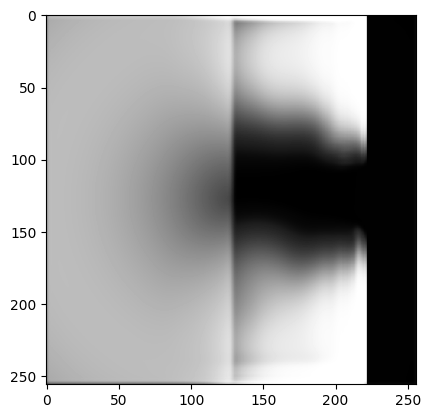

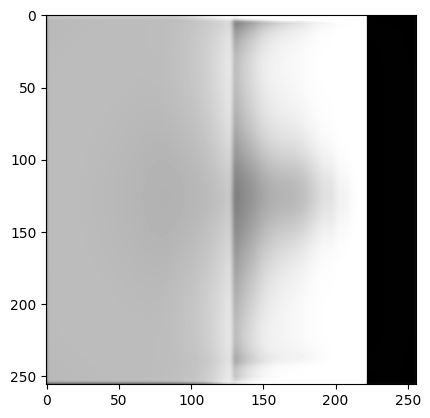

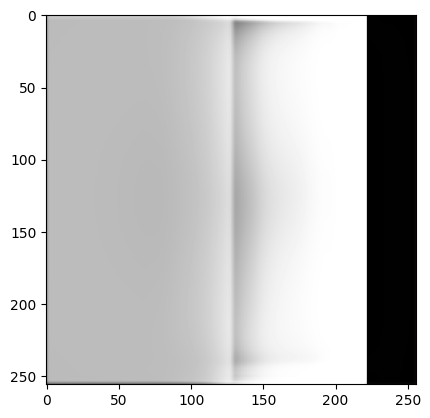

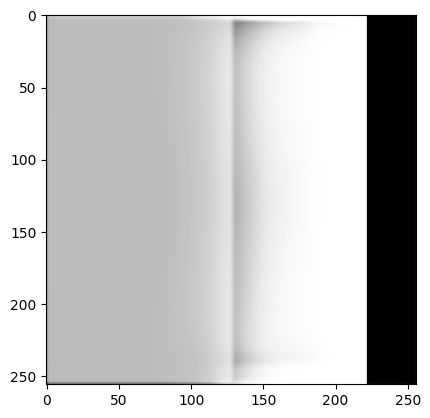

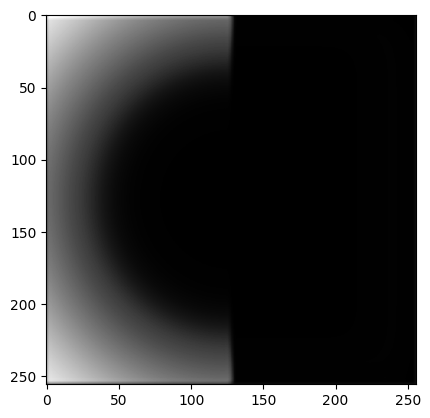

...

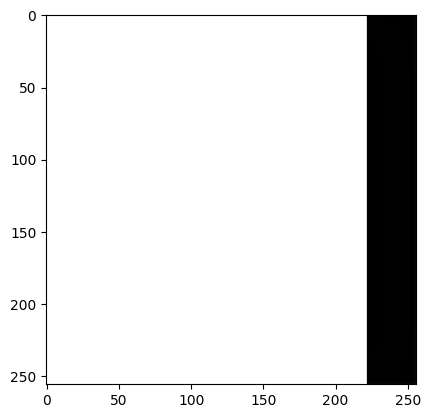

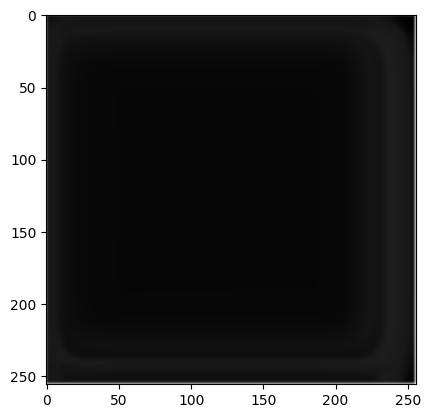

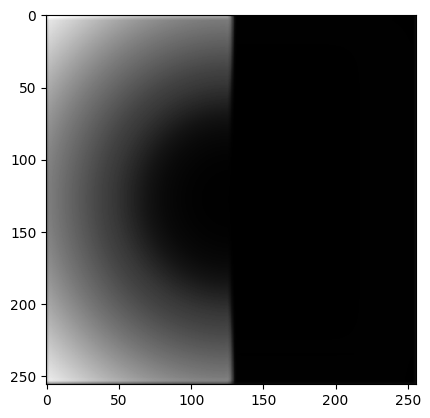

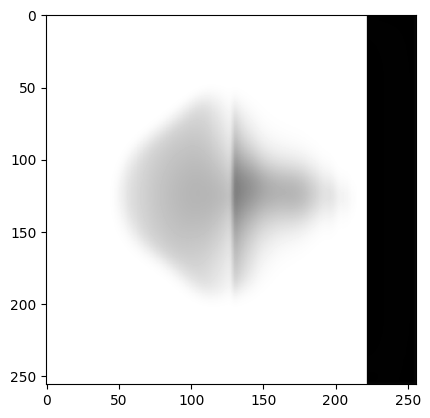

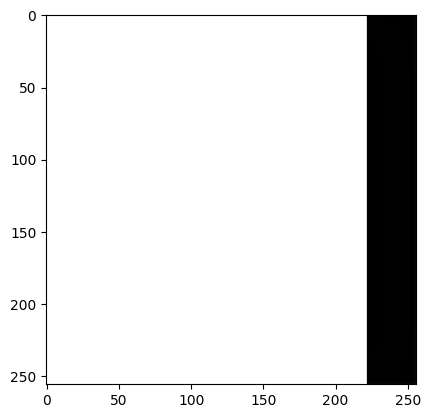

In [ ]:
for i in predicted_image22:
  plt.imshow(i)
  plt.show()

In [ ]:
error =